In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [5]:
data = pd.read_csv('housing.csv')
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


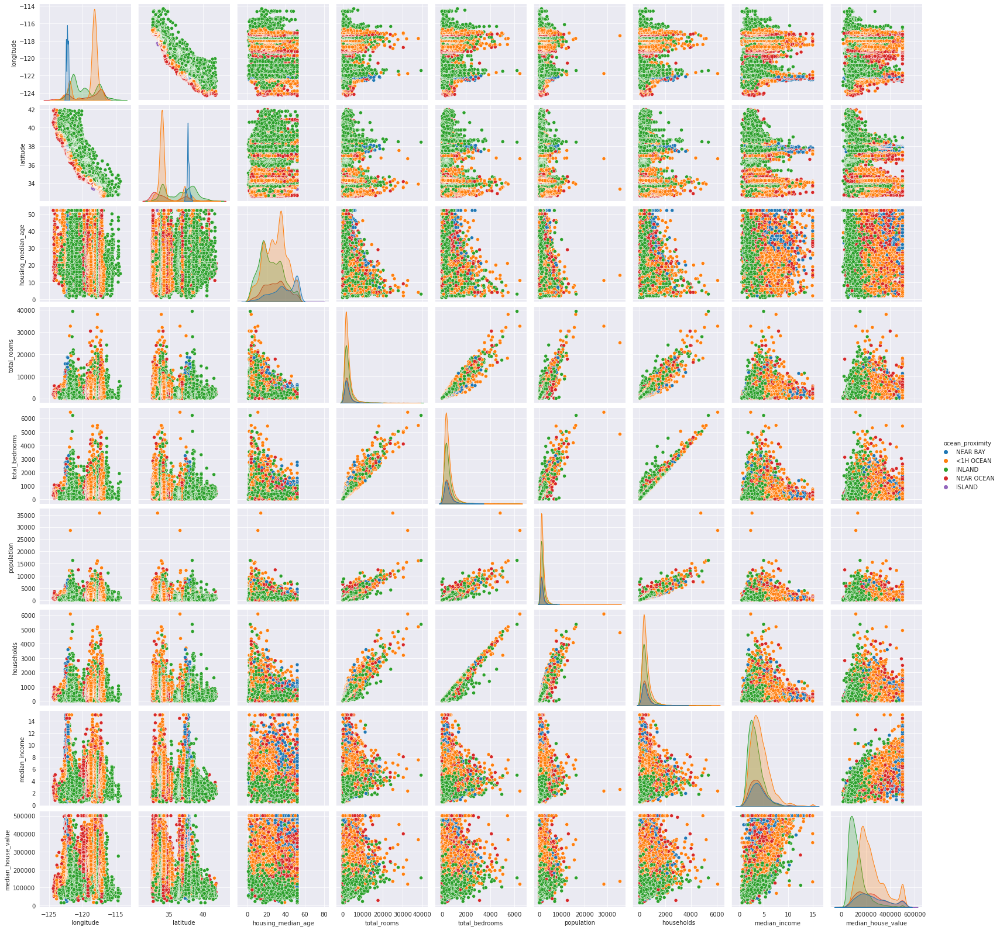

In [6]:
sns.pairplot(data, hue='ocean_proximity')

<AxesSubplot:>

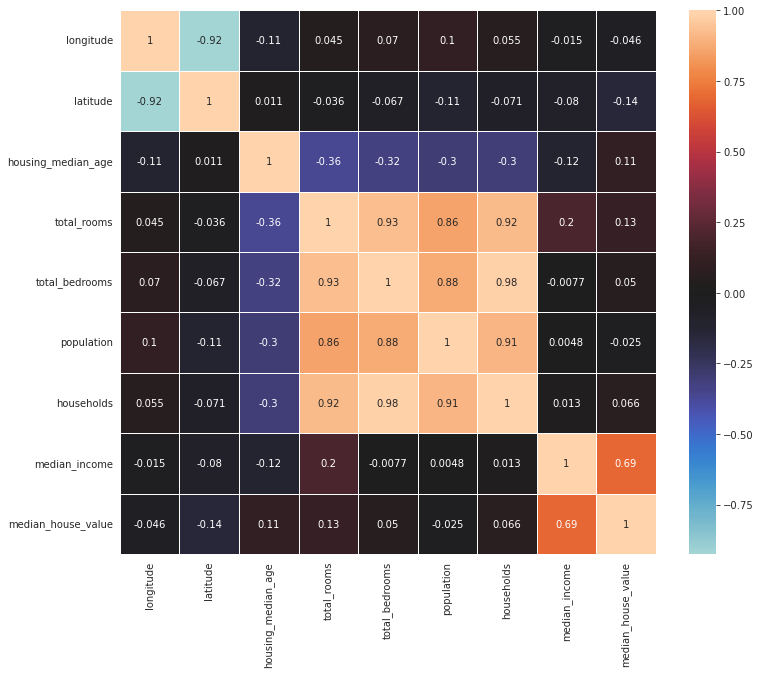

In [7]:
fig = plt.figure(figsize=(12, 10))
sns.heatmap(data.corr(), annot=True, linewidths=.5, center=0)

In [8]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=4, cols=3, start_cell="bottom-left")
traces = []
for column in data.columns:
    x = data[column].values
    traces.append(go.Histogram(x=x, name=column))
fig.add_traces(traces,
               rows=[4, 4, 4, 3, 3, 3, 2, 2, 2, 1],
               cols=[3, 2, 1, 3, 2, 1, 3, 2, 1, 3])
fig.update_layout(height=1200, width=1000, showlegend=True)
fig.show()

In [9]:
data.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [10]:
data.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [11]:
data.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

In [12]:
df = data.copy()

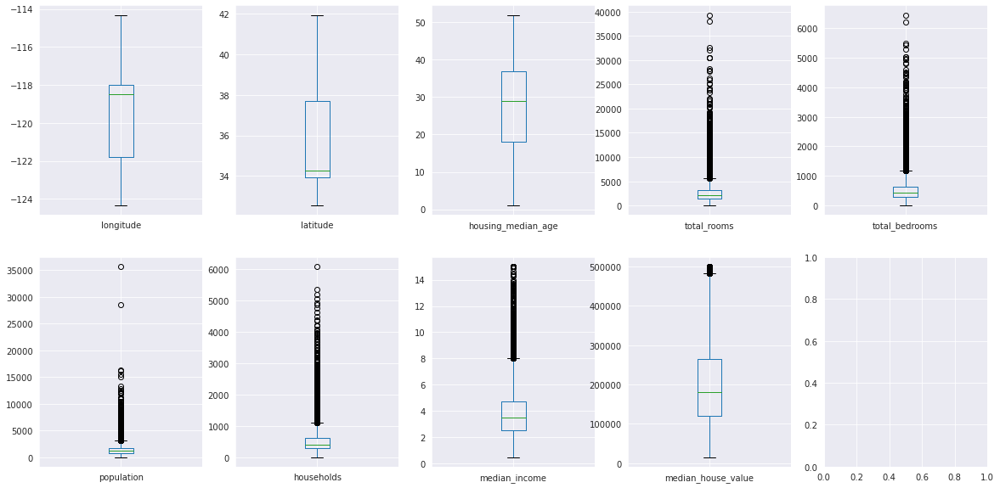

In [13]:
fig, ax = plt.subplots(2, 5, figsize=(20, 10))
i = 0
ax = ax.flatten()

for j, k in df.drop('ocean_proximity', axis=1).items():
    df.boxplot(j, ax=ax[i])
    i += 1


In [14]:
df = df.dropna()
df = df[df['total_rooms'] < 30_000]
df = df[df['total_bedrooms'] < 5_000]
df = df[df['population'] < 13_000]
df = df[df.households < 4_000]

In [15]:
len(data) - len(df)

224

In [16]:
label_encoder = LabelEncoder()
df['ocean_proximity'] = label_encoder.fit_transform(df['ocean_proximity'])

In [17]:
X = df.drop("median_house_value", axis=1)
y = df['median_house_value']

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=13)

In [19]:
lr = LinearRegression()
lr.fit(X_train, y_train)
lr.score(X_test, y_test)  # коэф-т детерминации

0.63250725765104

In [20]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(lr, X, y,
                         scoring="neg_root_mean_squared_error", cv=10)
(-scores).mean()

70202.8557220059

In [21]:
from sklearn.ensemble import GradientBoostingRegressor

In [22]:
GBR_model = GradientBoostingRegressor().fit(X_train, y_train)
# catboost_model.get_all_params()

In [23]:
GBR_model.score(X_train, y_train)  # коэф-т детерминации

0.786418883948506

In [24]:
GBR_model.score(X_test, y_test)
# model.plot_tree(200)

0.7658766224201268

In [ ]:
cv_score = cross_val_score(GBR_model, X, y, cv=10, scoring='neg_root_mean_squared_error')

In [ ]:
(-cv_score).mean()

In [27]:
def get_features_importance(model, data: np.ndarray, labels):
    y_pred = model.predict(data)
    rss = sum((labels - y_pred) ** 2)
    N = len(labels)
    n_feats = data.shape[1]
    b = model.coef_
    matrix = np.linalg.inv(np.dot(data.transpose(), data))  # (X_t * X)^(-1)
    s = np.sqrt(rss / (N - n_feats - 1))
    t_obs = [b[j] / s / np.sqrt(matrix[j][j]) for j in range(n_feats)]
    return t_obs


In [28]:
t_obs = get_features_importance(lr, X.values, y)

/home/limp/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



In [29]:
t_cr = 1.65
n_feats = X.shape[1]

In [32]:
imp_feat = [X.columns[i] for i in range(n_feats) if t_obs[i] > t_cr]
imp_feat_arg = [t_obs[i] for i in range(n_feats) if t_obs[i] > t_cr]
pd.DataFrame([imp_feat_arg], columns=imp_feat)

,housing_median_age,total_bedrooms,households,median_income
0,25.241801,16.652245,8.292786,123.908287


In [33]:
r2_score = lr.score(X, y)

In [34]:
# r2_score
free_deg = X.shape[0] - n_feats - 1
free_deg

20406

In [35]:
# критерий Фишера для определения важности регрессии в целом
f = (r2_score / (1 - r2_score)) * (free_deg / n_feats)

In [36]:
f

4048.8020985507333

In [37]:
f_cr = 1.83

In [40]:
importance = f > f_cr

In [41]:
importance

True

In [43]:
feat = 'median_income'
x_range_min, x_range_max = X[feat].min(), X[feat].max()
x_range = np.linspace(x_range_min, x_range_max, 1000).reshape(-1, 1)
lr_temp = LinearRegression().fit(X[feat].values.reshape(-1, 1), y)
gbr_temp = GradientBoostingRegressor().fit(X[feat].values.reshape(-1, 1), y)

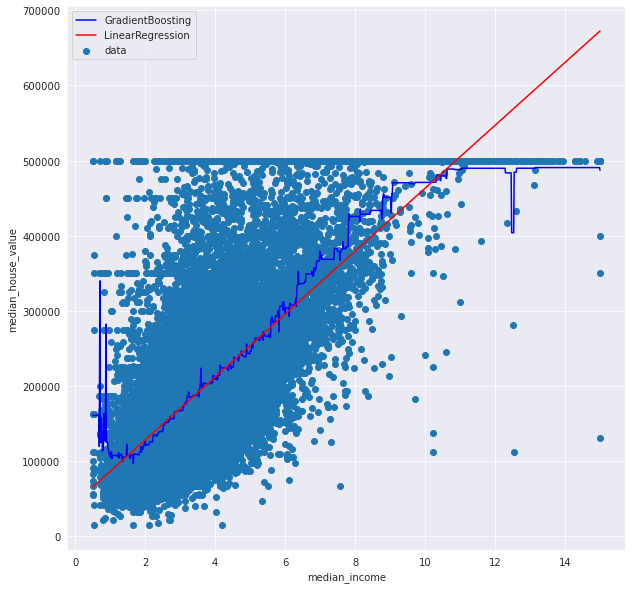

In [45]:
plt.figure(figsize=(10, 10))
plt.plot(x_range, gbr_temp.predict(x_range), color='b', label="GradientBoosting")
plt.plot(x_range, lr_temp.predict(x_range), color='r', label='LinearRegression')
plt.xlabel(feat)
plt.ylabel('median_house_value')
plt.scatter(X[feat], y, label='data')
plt.legend()